# Figures from "Spatially organized multicellular immune hubs in human colorectal cancer"
## Code for key pannels included in Figure 2

In [1]:
code = '../code/';
codeExternal =  '../external';
data = '../data/';



In [2]:
run([code 'util/run_set_figure_defaults.m']);

% Other options (e.g. svg or eps) are possible:
outSuf = { '-dpng' } 
outDirPlot = { '../results/figures/' };


zColSet = 

  struct with fields:

           rainbow14: {1x14 cell}
           rainbow15: {1x15 cell}
           rainbow18: {1x18 cell}
           rainbow21: {1x21 cell}
        crcTypeColor: {'#0072B2'  '#B2DF8A'  '#E41A1C'  '#FB9A99'}
            crcTypeC: {'#E41A1C'  '#0072B2'  '#B2DF8A'}
    crcTypeColorName: {'MSS'  'Normal'  'MSI_MLH1Meth'  'MSI_MLH1NoMeth'}


zColSet = 

  struct with fields:

           rainbow14: {1x14 cell}
           rainbow15: {1x15 cell}
           rainbow18: {1x18 cell}
           rainbow21: {1x21 cell}
        crcTypeColor: {'#0072B2'  '#B2DF8A'  '#E41A1C'  '#FB9A99'}
            crcTypeC: {'#E41A1C'  '#0072B2'  '#B2DF8A'}
    crcTypeColorName: {'MMRP'  'Normal'  'MMRd'  'MMRd_MLH1NoMeth'}


outSuf =

  1x1 cell array

    {'-dpng'}



In [3]:
addpath(genpath(code))

In [4]:
addpath(genpath(codeExternal))

## Loading main data object

In [5]:

colon10x_default = readDataRobj([ data 'colon10x_default/' ])

Reading: colon10x_default_dDvec_batchID.csv.gz
Read batchID (371223x1) variable
Reading: colon10x_default_dDvec_ensgID.csv.gz
Read ensgID (43078x1) variable
Reading: colon10x_default_dDvec_geneID.csv.gz
Read geneID (43078x1) variable
Reading: colon10x_default_dDvec_sampleID.csv.gz
Read sampleID (371223x1) variable
Reading: colon10x_default_dZ_annot.csv
Read annot (371223x3) table
Reading: colon10x_default_dZ_annot.csv.gz
Read annot (371223x3) table
Reading: colon10x_default_dZ_metatable.csv
Read metatable (371223x26) table
Reading: colon10x_default_dZ_metatable.csv.gz
Read metatable (371223x26) table
Reading: colon10x_default_dSp_rawCount.h5
Processing rawCount as matlab h5 sparse matrix
Read rawCount (43078x371223) sparse matrix

colon10x_default = 

  struct with fields:

      batchID: {371223x1 cell}
       ensgID: {43078x1 cell}
       geneID: {43078x1 cell}
     sampleID: {371223x1 cell}
        annot: [1x1 struct]
    metatable: [1x1 struct]
     rawCount: [43078x371223 double]


## Loading tSNE coordinate files

In [6]:


[zFile,~,zFname] = fileList([ data 'cNMF_tSNE/*.gz']);

zFname = regexprep(zFname,'.tsv.gz','');
zFname = regexprep(zFname,'crc295v4_cNMF_tSNE_','');
zFname = regexprep(zFname,'allImm','Imm');
zFname{end} = 'global';

for zi = 1:length(zFname)
   [zRaw,~,zH] = fastMatRead(zFile{zi});    
   tSNE_coord.(zFname{zi}).sampleID = zH;
   tSNE_coord.(zFname{zi}).ydata = zRaw;
end

tSNE_coord


tSNE_coord = 

  struct with fields:

               B: [1x1 struct]
             Epi: [1x1 struct]
         Epi_MSI: [1x1 struct]
         Epi_MSS: [1x1 struct]
      Epi_Normal: [1x1 struct]
         Myeloid: [1x1 struct]
          Plasma: [1x1 struct]
           Strom: [1x1 struct]
            TCD4: [1x1 struct]
            TCD8: [1x1 struct]
          TNKILC: [1x1 struct]
    TnonCD4orCD8: [1x1 struct]
             Imm: [1x1 struct]
         Imm_MSI: [1x1 struct]
         Imm_MSS: [1x1 struct]
      Imm_Normal: [1x1 struct]
          global: [1x1 struct]



## Load ccNMF summary file

In [7]:
ccNMFexpAlt = load([ data 'matlab/crc10x_c295v4_basic_ccNMFv6_reExp_qN_subSet.mat'])

zSubG = ismember(ccNMFexpAlt.ensgID,colon10x_default.ensgID);
ccNMFexpAlt = structSubSelectMat(ccNMFexpAlt,zSubG);
assert(isequal(ccNMFexpAlt.ensgID,colon10x_default.ensgID));


ccNMFexpAlt = 

  struct with fields:

          Hmat: [1x1 struct]
          Kdim: [14 7 22 11 25 21 29 32 43]
          Wmat: [1x1 struct]
       batchID: {371223x1 cell}
     batchList: {1x9 cell}
        ensgID: {43113x1 cell}
        geneID: {43113x1 cell}
      isSample: [371223x9 logical]
     isVarGene: [43113x9 logical]
      sampleID: {371223x1 cell}
        wNames: {1x9 cell}
     wNamesExp: {1x9 cell}
    wNamesOrig: [1x1 struct]
      wNamesSt: [1x1 struct]



In [8]:

colon10x_default.metatable.MMRStatusTumor = colon10x_default.metatable.MMRStatus;
colon10x_default.metatable.MMRStatusTumor = regexprep(colon10x_default.metatable.MMRStatusTumor,'NA','Normal');

zBID = mergeStringPair(colon10x_default.metatable.MMRStatusTumor,colon10x_default.metatable.PatientTypeID);


zOutP =

    'Figure_2'

Done - return


In [9]:
%% Figre 2 
% Immune composition 
zOutP = 'Figure_2';

zSelImmB = { 'cB1' 'cB2' 'cB3'  'cP1' 'cP2' 'cP3' };
zSelImmM = { 'cMA01' 'cM01' 'cM02' 'cM03' 'cM04' 'cM05' 'cM06' 'cM07' 'cM08' 'cM09' 'cM10' };
zSelImmT = {'cTNI01' 'cTNI02' 'cTNI03' 'cTNI04' 'cTNI05' 'cTNI06' 'cTNI07' 'cTNI08' 'cTNI09' 'cTNI10' 'cTNI11' 'cTNI12' 'cTNI13' 'cTNI14' 'cTNI15' 'cTNI16' 'cTNI17' 'cTNI18' 'cTNI19' 'cTNI20' 'cTNI21' 'cTNI22' 'cTNI23' 'cTNI24' 'cTNI25' 'cTNI26'};

zSelImmAll = [ zSelImmT zSelImmB zSelImmM ];

%

zGroupT = groupTable(colon10x_default.metatable,'PatientTypeID');

%

zOrderCellAll = [ zGroupT.PatientTypeID(strcmp(zGroupT.MMRStatusTumor,'MMRd')); zGroupT.PatientTypeID(strcmp(zGroupT.MMRStatusTumor,'MMRp'));  zGroupT.PatientTypeID(strcmp(zGroupT.MMRStatusTumor,'Normal'))];

zOrderCell = [ zGroupT.PatientTypeID(strcmp(zGroupT.MMRStatusTumor,'MMRd')); zGroupT.PatientTypeID(strcmp(zGroupT.MMRStatusTumor,'MMRp'));];

Done - return


### Supplemental Figure 2B - Heatmap/dot comparing imune composition

In [12]:
%plot -s 1800,1800
zBsmp = colon10x_default.metatable.PatientTypeID;
[zB,~,~,zCnt] = fastUnique(zBsmp);
zIsOver1K = ismember(zBsmp,zB(zCnt>1000));

zSel = zIsOver1K & ~strgrep(cellstr(colon10x_default.annot.clTopLevel),'Epi|Strom',1);    
sum(zSel)

% tabFilter(colon10x_default.batchID,zSel)


% Comp vs normal 

zClust = regexprep(colon10x_default.annot.clFull(zSel),' .*','');
zPid = zBsmp(zSel);


zCC = crossTabTable(zClust,zPid,0,3);
% zSelN = strgrep(zCC.Properties.VariableNames,'N_'); !!
zSelN = strgrep(zCC.Properties.VariableNames,'_N');
zCC.Properties.RowNames;
zCCmat = table2array(zCC)+5; 

zCCnormal = zCCmat(:,zSelN);
zCCnormal = zCCnormal./sum(zCCnormal);

zCCnormal = median(zCCnormal,2);
zCCnormal = zCCnormal./sum(zCCnormal);

zCCexp = zCCnormal*sum(zCCmat);
zCCpr = (zCCmat - zCCexp)./sqrt(zCCexp);

zCCfreq = table2array(zCC);
zCCfreq = zCCfreq./sum(zCCfreq);


zLim = [ 0.05 0.1 0.15 0.2 0.25 ];

zCCcount = arrayfun(@(x)zCCfreq > x,zLim,'unif',0);


zCCfreqM = zCCfreq;
zCCfreqM = min(zCCfreqM,0.3);

zCCalt = array2table(zCCfreqM);
zCCalt.Properties.VariableNames = zCC.Properties.VariableNames;
zCCalt.Properties.RowNames = zCC.Properties.RowNames;

% 

[~,zia,zib] = intersect(zSelImmAll,zCC.Properties.RowNames);
zordT = zib(argsort(zia));

%

[~,zia,zib] = intersect(zOrderCell,zCC.Properties.VariableNames);
zCellOrder = zib(argsort(zia));

%%

                axisObj: []
               clustTxt: 1
     XTickLabelRotation: 90
               colormap: [128x3 double]
            maxColorLim: 0.9500
               fontSize: 12
           axisFontSize: 18
            pseudoCount: 0
              colorType: 'pearson'
                 annotX: [1x1 struct]
                  extPR: [43x63 double]
              gridLines: 'none'
                 pdistX: 'Euc'
                 pdistY: 'Spe'
               linkageX: 'ward'
               linkageY: 'average'
                showTxt: 0
                doSortX: 0
                doSortY: 0
    doLeafOptimalOrderX: 0
    doLeafOptimalOrderY: 0
              colorHard: [-50 50]
              doDotPlot: 1
          dotPlotFactor: 500
           dotPlotColor: [0 0 0]

Using external PRDone - return

zOrdTX =

     []

Nothing to subset (selecting all)
                   legendFig: 1
                  sortLegend: 1
                legendOrient: 'Vertical'
               groupColorMap: {[12x3 do

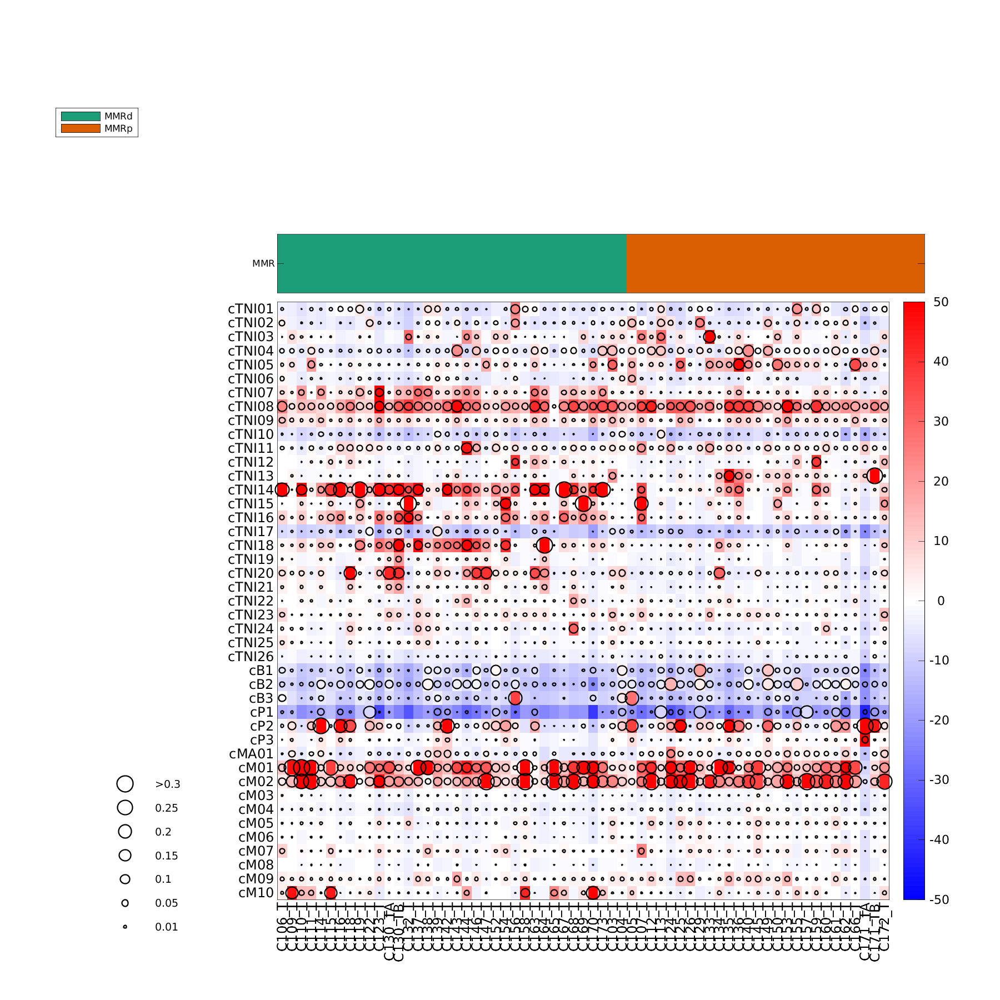

In [13]:
%plot -s 1800,1800

zopts = [];
zopts.fontSize = 12;
zopts.pdistX = 'Euc';
zopts.pdistY = 'Spe';
zopts.pseudoCount = 0;
% zopts.colorType = 'pearson';
zopts.linkageX = 'ward';
zopts.linkageY = 'average';
zopts.showTxt = 0;

zopts.doSortX = 0;
zopts.doSortY = 0;
zopts.doLeafOptimalOrderX = 0;
zopts.doLeafOptimalOrderY = 0;

zopts.annotX.sampleID =  zGroupT.PatientTypeID;
zopts.annotX.MMR = zGroupT.MMRStatusTumor;
zopts.colorHard = [ -50 50 ];

zopts.extPR = zCCpr(zordT,zCellOrder);

zopts.colormap = redblue(128);
zopts.doDotPlot = 1;
zopts.dotPlotFactor = 500;
zopts.dotPlotColor = [0 0 0];
zopts.XTickLabelRotation = 90;


[zfig,zOutTable,zOrdX,zOrdY] = plot_crosstab_heatmap_alt([],[],[],zCCalt(zordT,zCellOrder),zopts);

%%

delete(zfig.Children(6:7));


% Legend

zxval = [ 0.01 0.05 0.1 0.15 0.2 0.25 0.3 ];
zxv = zxval*zopts.dotPlotFactor;
zn =length(zxv);
zxy = 1:zn;
zxx = ones(1,zn);

hold on;
zax = subplot('Position',[0.05 0.05 0.15 0.5]);
zaxp = scatter(zxx,zxy,zxv);
%
ylim([ 0 zn*3]);
xlim([ 0.75 1.25]);

%
zaxp.CData = [ 0 0 0];
zaxp.LineWidth = 1;

%
zvtxt = arrayfun(@(x)sprintf('%g',x),zxval,'unif',0);
zvtxt{end} = [ '>' zvtxt{end} ]

%
text(zxx+0.1,zxy,zvtxt,'fontsize',14);
axis off;

%% 

zOutPlot = sprintf('%s/SFig2b_ImmuneCellComp_enrichment_dot',zOutP);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);

### Figure 2A Immune composition 

In [26]:
zClust = regexprep(colon10x_default.annot.clFull(zSel),' .*','');
zPid = zBsmp(zSel);

zCC = crossTabTable(zClust,zPid,0,3);
zSelN = strgrep(zCC.Properties.VariableNames,'_N');

zCCmat = table2array(zCC)+5; 

zCCnormal = zCCmat(:,zSelN);
zCCnormal = zCCnormal./sum(zCCnormal);

zCCnormal = median(zCCnormal,2);
zCCnormal = zCCnormal./sum(zCCnormal);

zCCexp = zCCnormal*sum(zCCmat);
zCCpr = (zCCmat - zCCexp)./sqrt(zCCexp);


%% 

[~,zia,zib] = intersect(zSelImmAll,zCC.Properties.RowNames);
zordT = zib(argsort(zia));


[~,zia,zib] = intersect(zOrderCell,zCC.Properties.VariableNames);
zCellOrder = zib(argsort(zia));

zCCfreq = table2array(zCC);
zCCfreq = zCCfreq./sum(zCCfreq);

%
zCCfreqM = zCCfreq;

zCCalt = array2table(zCCfreqM);
zCCalt.Properties.VariableNames = zCC.Properties.VariableNames;
zCCalt.Properties.RowNames = zCC.Properties.RowNames;

mmrMap = containers.Map(zGroupT.PatientTypeID,zGroupT.MMRStatusTumor);

%

In [27]:
zType = nanvalues(mmrMap,zCC.Properties.VariableNames);


zopts = [];
% zopts.aggrFunc = @(X,dim)quantile(X,0.5,dim);
zopts.aggrFunc = @(X,dim)mean(X,dim);
[zHfreq,~,zTypeN] = summarize_group(zCCfreq,zType,zopts);
max(zHfreq)

zopts = [];
zopts.aggrFunc = @(X,dim)mean(X,dim);
[zHpr,~,zTypeNpr] = summarize_group(zCCpr,zType,zopts);

Done - return

ans =

    0.1327    0.1731    0.2764

Done - return


                axisObj: []
               clustTxt: 1
     XTickLabelRotation: 60
               colormap: [128x3 double]
            maxColorLim: 0.9500
               fontSize: 12
           axisFontSize: 18
            pseudoCount: 0
              colorType: 'pearson'
                 annotX: []
                  extPR: [43x3 double]
              gridLines: '-'
                 pdistX: 'Euc'
                 pdistY: 'Spe'
               linkageX: 'ward'
               linkageY: 'average'
                showTxt: 0
                doSortX: 0
                doSortY: 0
    doLeafOptimalOrderX: 0
    doLeafOptimalOrderY: 0
              colorHard: [-50 50]
              doDotPlot: 1
          dotPlotFactor: 1000
           dotPlotColor: [0 0 0]

Using external PR
zOrdTX =

     []


zfig = 

  Figure (1) with properties:

      Number: 1
        Name: ''
       Color: [1 1 1]
    Position: [200 10 500 1700]
       Units: 'pixels'

  Use GET to show all properties


zfig = 

  Figure 

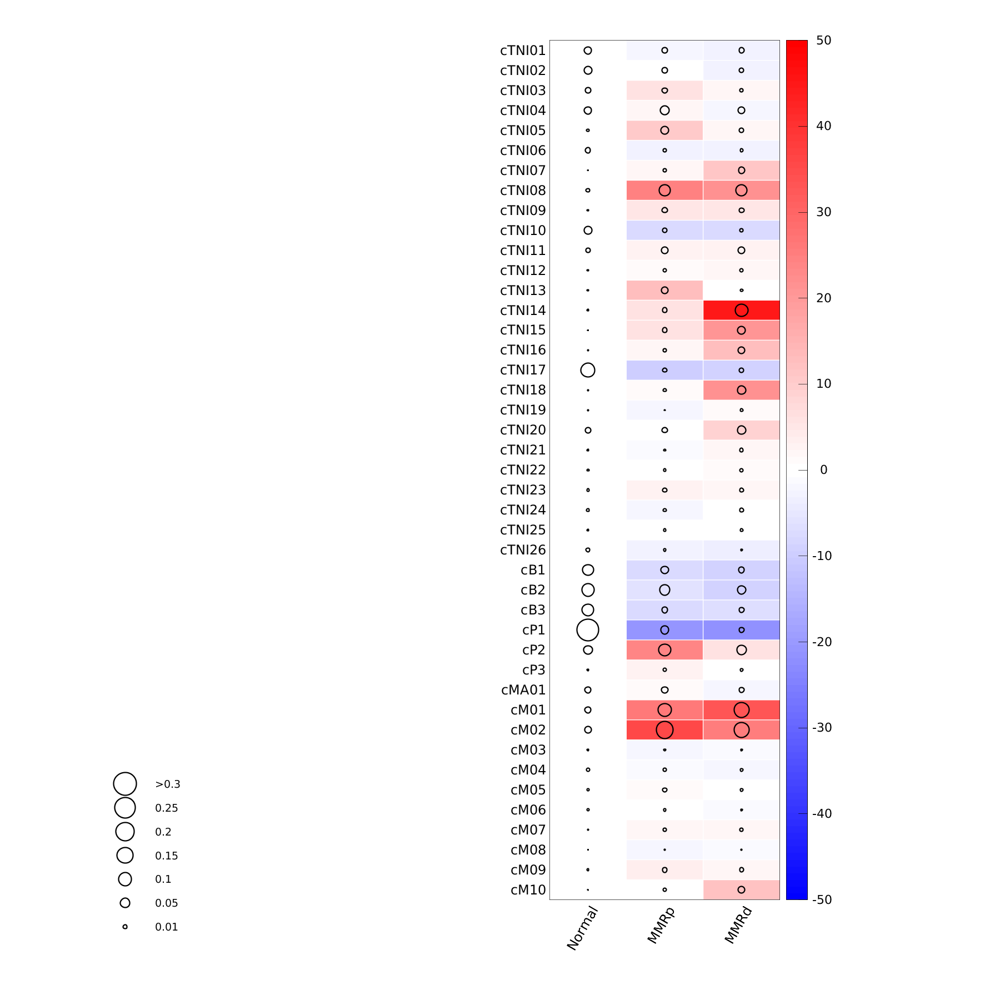

In [28]:
zord = [ 3 2 1 ];

zTypeN = zTypeN(zord);

zHfreq = array2table(zHfreq(:,zord),'VariableNames',zTypeN);
% zHpr = array2table(zHpr(:,zord),'VariableNames',zTypeN);

zHpr = zHpr(:,zord);
zHpr(:,1) = 0; % Zero normal
zHfreq.Properties.RowNames = zCC.Properties.RowNames;

% zHpr.Properties.RowNames = zCC.Properties.RowNames;

[~,zia,zib] = intersect(zSelImmAll,zCC.Properties.RowNames);
zordT = zib(argsort(zia));

zopts = [];
zopts.fontSize = 12;
zopts.pdistX = 'Euc';
zopts.pdistY = 'Spe';
zopts.pseudoCount = 0;
% zopts.colorType = 'pearson';
zopts.linkageX = 'ward';
zopts.linkageY = 'average';
zopts.showTxt = 0;
zopts.doSortX = 0;
zopts.doSortY = 0;
zopts.doLeafOptimalOrderX = 0;
zopts.doLeafOptimalOrderY = 0;

zopts.colorHard = [ -50 50 ];

zopts.extPR = zHpr(zordT,:);

zopts.colormap = redblue(128);
zopts.doDotPlot = 1;
zopts.dotPlotFactor = 1000;
zopts.dotPlotColor = [0 0 0];
zopts.gridLines = '-';

[zfig,zOutTable,zOrdX,zOrdY] = plot_crosstab_heatmap_alt([],[],[],zHfreq(zordT,:),zopts);

%% 

delete(zfig.Children(3:5));
zfig.Position = [200 10 500 1700];

zfig.Children(2).Position(1) = 0.55;
zfig.Children(2).Position(2) = 0.1
zfig.Children(2).Position(3) = 0.23;
zfig.Children(2).Position(4) = 0.86

for zk = 2:length(zfig.Children(2).Children)-1
    zfig.Children(2).Children(zk).Color = [1 1 1];
end

% Legend
zxval = [ 0.01 0.05 0.1 0.15 0.2 0.25 0.3 ];
zxv = zxval*zopts.dotPlotFactor;
zn =length(zxv);
zxy = 1:zn;
zxx = ones(1,zn);

hold on;
zax = subplot('Position',[0.05 0.05 0.15 0.5]);
zaxp = scatter(zxx,zxy,zxv);
%
ylim([ 0 zn*3]);
xlim([ 0.75 1.25]);

%
zaxp.CData = [ 0 0 0];
zaxp.LineWidth = 1

%
zvtxt = arrayfun(@(x)sprintf('%g',x),zxval,'unif',0);
zvtxt{end} = [ '>' zvtxt{end} ];

%
text(zxx+0.1,zxy,zvtxt,'fontsize',14);
axis off;

%% 

zOutPlot = sprintf('%s/Fig2a_ImmuneCellComp_enrichment_mean_dot',zOutP);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);

### Figure 2B -- Myeloid tSNE 


zopts =

     []

Saving plot: ../results/figures//Figure_2/Fig2b_tSNE_Myeloid_MMRsplit.png.-dpng


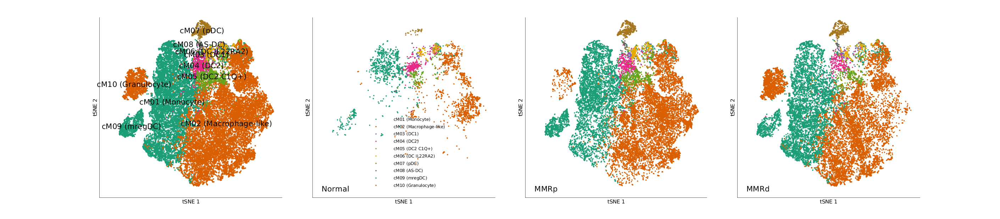

In [31]:
%plot -s 2820,620
zcf = 'Myeloid';
[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zCl = colon10x_default.annot.clFull(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);

zfig = figure('Position',[0 0 2820 620]);
subplot1(1,4);

zopts = []
zopts.newPlot = 0;
zopts.pSize = 8;
zopts.doAlpha = 0.7;
zopts.doPosTxt = 1;
zopts.fontSize = 16;
zCmap = brewermap(luniq(zCl),'Dark2');

subplot1(1);
plot_tsne_scatter(zYdata,zCl,zCmap,[],zopts);

zyl = ylim();
zxl = xlim();

zopts.newPlot = 0;
zopts.pSize = 8;
zopts.doPosTxt = 0;
zopts.fontSize = 16;
legend off 

subplot1(2);
zSelS = strcmp(zMMRtype','Normal');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'Normal','sc');

xlim(zxl);
ylim(zyl);


subplot1(3);
zSelS = strcmp(zMMRtype,'MMRp');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'MMRp','sc');

legend off 
xlim(zxl);
ylim(zyl);

subplot1(4);
zSelS = strcmp(zMMRtype,'MMRd');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'MMRd','sc');

legend off 
xlim(zxl);
ylim(zyl);


%% 

zOutPlot = sprintf('%s/Fig2b_tSNE_%s_MMRsplit',zOutP,zcf);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);


### Figure 2C -- Myeloid program compsition violin and tSNE


zcf =

    'Myeloid'

Done - return
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_co

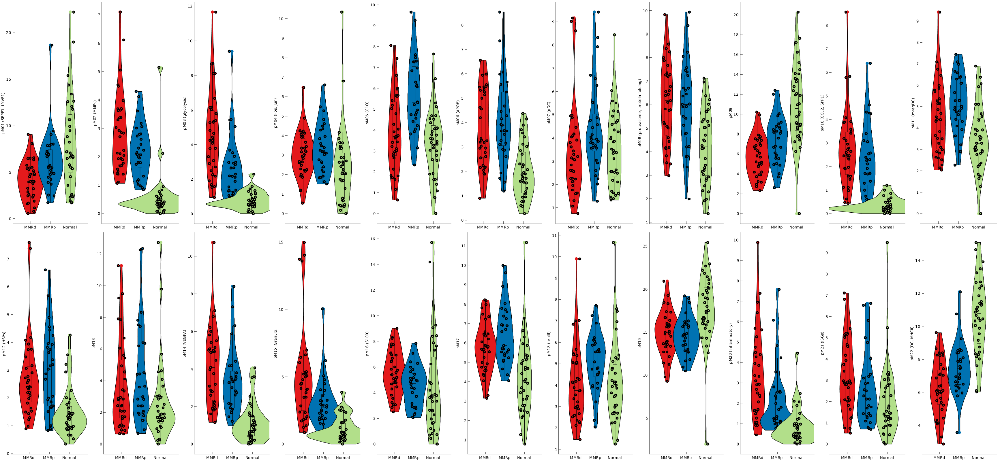

In [35]:
%plot -s 2600,1200
zcf = 'Myeloid'
[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zCl = colon10x_default.annot.clMidway(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);

zHmat = ccNMFexpAlt.Hmat.(zcf)';
zHmat = zHmat(zia,:);

zWnames = ccNMFexpAlt.wNamesSt.(zcf);

% 

zBID = mergeStringPair(colon10x_default.metatable.MMRStatusTumor,colon10x_default.metatable.PatientTypeID);
zBIDsub = zBID(zia);

%

zopts = [];
zopts.aggrFunct = @(X,dim)quantile(X,0.75,dim);
[zHq75,~,zN] = summarize_group(zHmat',zBIDsub);
zHq75 = zHq75';

%

zNtype = regexprep(zN,'_.*','');

% 
% zopts = [];
% zopts.maxRow = 11;
% zopts.dodge = 0.6;
% plot_violin_simple(zWnames',zHq75,zNtype,zopts);
%

zfig = figure('Position',[ 0 0 2600 1200]);

zopts = [];
zopts.widthV = 0.9;
zopts.widthBox = 0.6;
zopts.doJitter = 0.4;
zopts.cmap = colorSet(zColSet.crcTypeC);
clear g 
for zi = 1:11 
    
    g(1,zi) = gramm('x',zNtype,'y',zHq75(:,zi),'Color',zNtype);
    g(1,zi).stat_violin2('width',zopts.widthV);
    g(1,zi).stat_boxplot('width',zopts.widthBox);
    g(1,zi).geom_jitter('width',zopts.doJitter);
    g(1,zi).set_names('x','','y',zWnames{zi});
end

for zi = 12:22
    zp = zi - 11;
    g(2,zp) = gramm('x',zNtype,'y',zHq75(:,zi),'Color',zNtype);
    g(2,zp).stat_violin2('width',zopts.widthV);
    g(2,zp).stat_boxplot('width',zopts.widthBox);
    g(2,zp).geom_jitter('width',zopts.doJitter);
    g(2,zp).set_names('x','','y',zWnames{zi});
end

g.set_color_options('map',zopts.cmap,'n_color',size(zopts.cmap,1));
g.set_layout_options('legend',false);

outG = g.draw();

%%

zfig = gcf();
zOutPlot = sprintf('%s/Fig2c_expProgramPidViolin_myeloid_MMRsplit',zOutP);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);
% close(zfig)

Saving plot: ../results/figures//Figure_2/Fig2c_tSNE_Myeloid_Hmat_Myeloid_1.png.-dpng
Saving plot: ../results/figures//Figure_2/Fig2c_tSNE_Myeloid_Hmat_Myeloid_2.png.-dpng


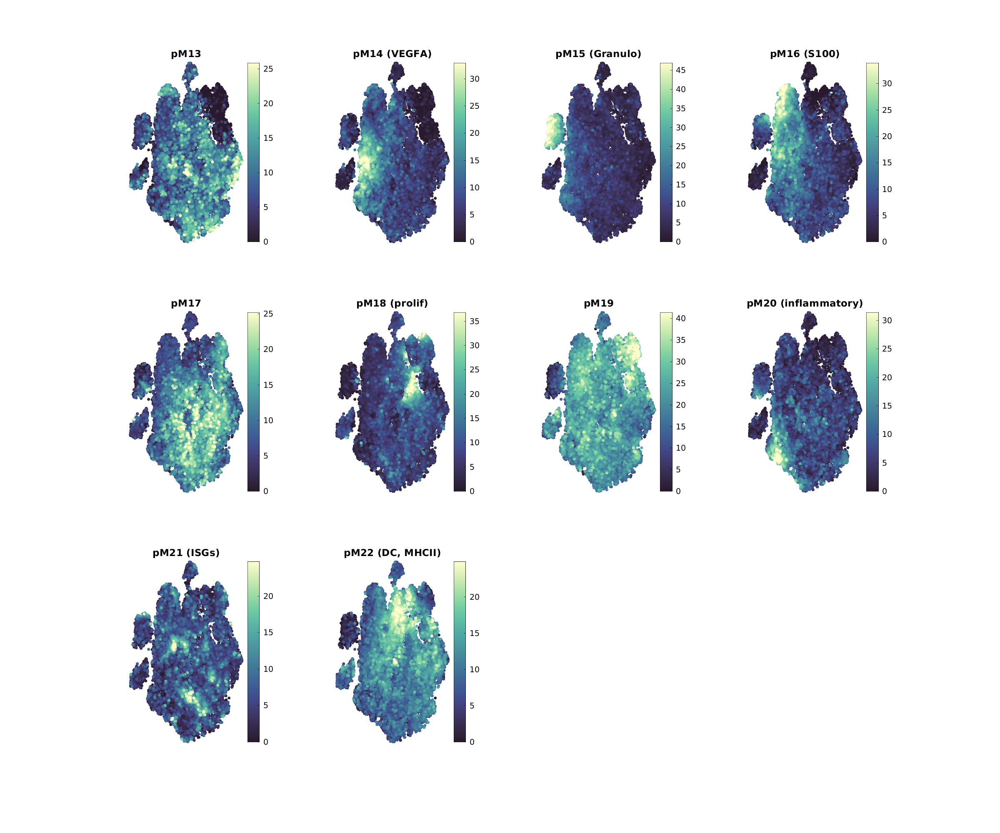

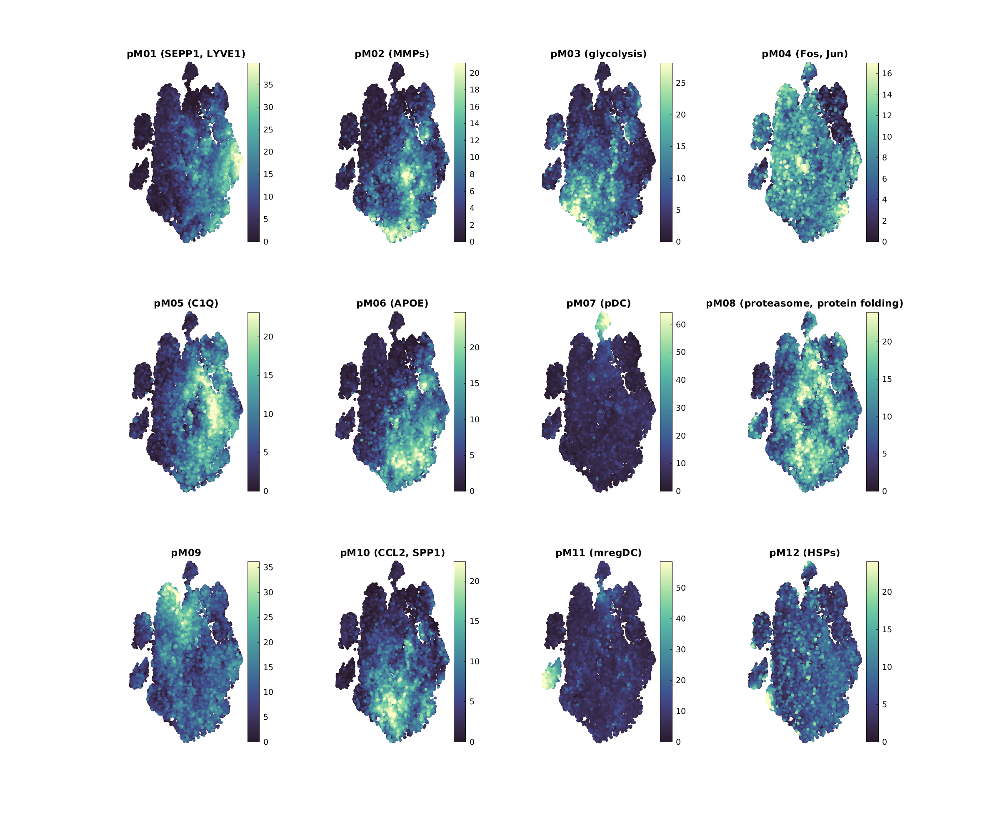

In [38]:
%plot -s 2400,2000

zcf = 'Myeloid';
zp = 'Myeloid';

[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zHval = ccNMFexpAlt.Hmat.(zp)';

zopts = [];
zopts.pSize = 7;
zopts.doAlpha = 0.7;
zopts.qTrimLimNNZ = 0.999;
zopts.titleText = ccNMFexpAlt.wNamesSt.(zp);
zopts.nCol = 4;
zopts.nRow = 3;
zopts.tiledLayout = 0;
zopts.plotSize = [ 1 1 2400 2000 ];
zopts.cmap = flipud(cptcmap('deep'));

zfig = plot_tsne_scatter_multi(zYdata,zHval(zia,:),[],[],zopts);

%% 

zOutPlot = sprintf('%s/Fig2c_tSNE_%s_Hmat_%s',zOutP,zcf,zp);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);
% cellfun(@(x)close(x),zfig)

### Figure 2D -- T/NK/ILC tSNE 


zcf =

    'TNKILC'


zopts =

     []


zCmap =

    0.1059    0.6196    0.4667
    0.8510    0.3725    0.0078
    0.4588    0.4392    0.7020
    0.9059    0.1608    0.5412
    0.4000    0.6510    0.1176
    0.9020    0.6706    0.0078

Saving plot: ../results/figures//Figure_2/Fig2d_tSNE_TNKILC_MMRsplit.png.-dpng


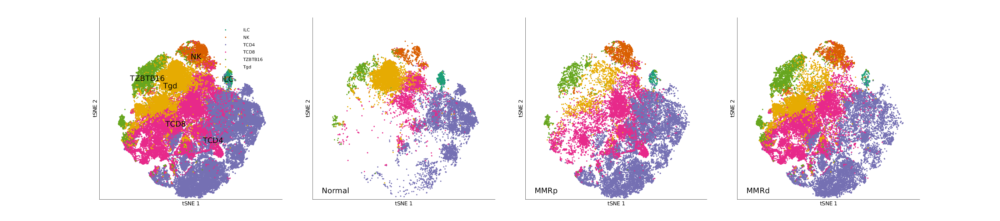

In [41]:
%plot -s 2800,620
zcf = 'TNKILC'
[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zCl = colon10x_default.annot.clMidway(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);

zfig = figure('Position',[0 0 2821 620]);
subplot1(1,4);

zopts = []
zopts.newPlot = 0;
zopts.pSize = 8;
zopts.doAlpha = 0.7;
zopts.doPosTxt = 1;
zopts.fontSize = 16;
zCmap = brewermap(luniq(zCl),'Dark2')

subplot1(1);
plot_tsne_scatter(zYdata,zCl,zCmap,[],zopts);

zyl = ylim();
zxl = xlim();

zopts.newPlot = 0;
zopts.pSize = 8;
zopts.doPosTxt = 0;
zopts.fontSize = 16;

subplot1(2);
zSelS = strcmp(zMMRtype','Normal');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'Normal','sc');

legend off 
xlim(zxl)
ylim(zyl);


subplot1(3);
zSelS = strcmp(zMMRtype,'MMRp');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'MMRp','sc');

legend off 
xlim(zxl)
ylim(zyl);

subplot1(4);
zSelS = strcmp(zMMRtype,'MMRd');
plot_tsne_scatter(zYdata(zSelS,:),zCl(zSelS),zCmap,[],zopts);
text(0.05,0.05,'MMRd','sc');

legend off 
xlim(zxl)
ylim(zyl);

%% 

zOutPlot = sprintf('%s/Fig2d_tSNE_%s_MMRsplit',zOutP,zcf);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);
% close(zfig)

In [ ]:
%% Figure 2e - TODO 

### Figure 2f


zcf =

    'TNKILC'


zWnames =

  21x1 cell array

    {'pTNI01 (Fos, Jun)'         }
    {'pTNI02 (Treg)'             }
    {'pTNI03 (prolif)'           }
    {'pTNI04'                    }
    {'pTNI05'                    }
    {'pTNI06 (MHCII, IFNg)'      }
    {'pTNI07 (proteasome, ER)'   }
    {'pTNI08 (innate T)'         }
    {'pTNI09 (Elongationfactors)'}
    {'pTNI10'                    }
    {'pTNI11'                    }
    {'pTNI12'                    }
    {'pTNI13 (prolif)'           }
    {'pTNI14 (gd-like T)'        }
    {'pTNI15 (HSPs)'             }
    {'pTNI16 (cytotoxicity)'     }
    {'pTNI17'                    }
    {'pTNI18 (CXCL13 T)'         }
    {'pTNI19 (ISGs)'             }
    {'pTNI20 (GZMK)'             }
    {'pTNI21 (KLRB1)'            }

Done - return
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_color and n_lightness specified, defaults to n_lightness=1
Custom colormap without n_c

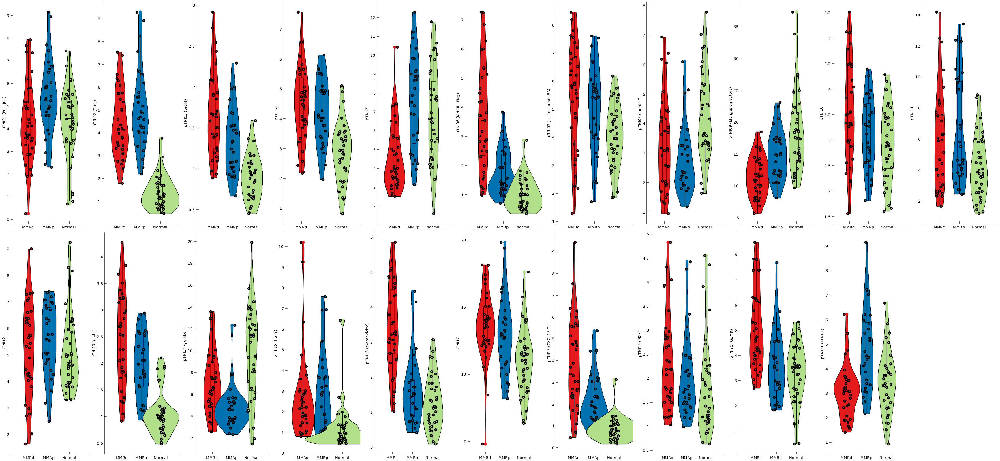

In [43]:
%plot -s 2600,1200
zcf = 'TNKILC'
zp = 'T';
[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zCl = colon10x_default.annot.clMidway(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);
zMMRtype = colon10x_default.metatable.MMRStatusTumor(zia);

zHmat = ccNMFexpAlt.Hmat.(zp)';
zHmat = zHmat(zia,:);

zWnames = ccNMFexpAlt.wNamesSt.(zp);

%

zBID = mergeStringPair(colon10x_default.metatable.MMRStatusTumor,colon10x_default.metatable.PatientTypeID);
zBIDsub = zBID(zia);

%

zopts = [];
zopts.aggrFunct = @(X,dim)quantile(X,0.75,dim);
[zHq75,~,zN] = summarize_group(zHmat',zBIDsub);
zHq75 = zHq75';

%

zNtype = regexprep(zN,'_.*','');

%% 
% zopts = [];
% zopts.maxRow = 11;
% zopts.dodge = 0.6;
% plot_violin_simple(zWnames',zHq75,zNtype,zopts)

%

zfig = figure('Position',[ 0 0 2600 1200]);

zopts = [];
zopts.widthV = 0.9;
zopts.widthBox = 0.6;
zopts.doJitter = 0.4;
zopts.cmap = colorSet(zColSet.crcTypeC);
clear g 
for zi = 1:11 
    
    g(1,zi) = gramm('x',zNtype,'y',zHq75(:,zi),'Color',zNtype);
    g(1,zi).stat_violin2('width',zopts.widthV);
    g(1,zi).stat_boxplot('width',zopts.widthBox);
    g(1,zi).geom_jitter('width',zopts.doJitter);
    g(1,zi).set_names('x','','y',zWnames{zi});
end

for zi = 12:21
    zp = zi - 11;
    g(2,zp) = gramm('x',zNtype,'y',zHq75(:,zi),'Color',zNtype);
    g(2,zp).stat_violin2('width',zopts.widthV);
    g(2,zp).stat_boxplot('width',zopts.widthBox);
    g(2,zp).geom_jitter('width',zopts.doJitter);
    g(2,zp).set_names('x','','y',zWnames{zi});
end

g.set_color_options('map',zopts.cmap,'n_color',size(zopts.cmap,1));
g.set_layout_options('legend',false);

outG = g.draw();

%

zfig = gcf();
zOutPlot = sprintf('%s/Fig2f_expProgramPidViolin_TNKILC_MMRsplit',zOutP);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);
% close(zfig)



zopts =

     []

Saving plot: ../results/figures//Figure_2/Fig2f_tSNE_TNKILC_Hmat_T_1.png.-dpng
Saving plot: ../results/figures//Figure_2/Fig2f_tSNE_TNKILC_Hmat_T_2.png.-dpng


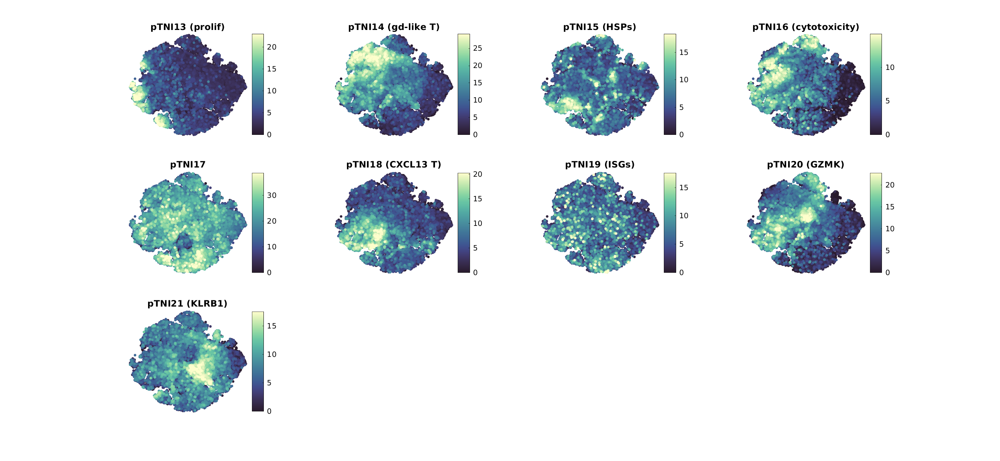

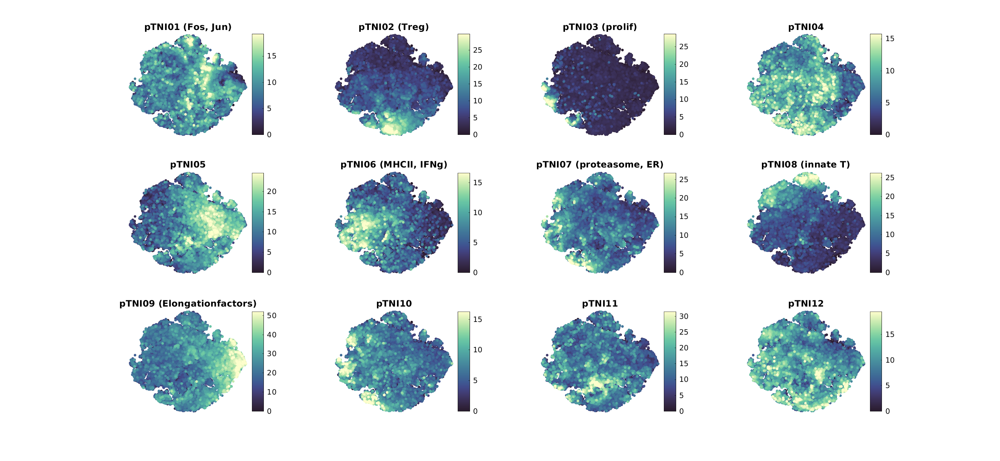

In [44]:
% Todo update colormap
%plot -s 2400,2000

zcf = 'TNKILC';
zp = 'T';

[zia,zib] = comember(colon10x_default.sampleID,tSNE_coord.(zcf).sampleID);

zYdata = tSNE_coord.(zcf).ydata(zib,:);
zHval = ccNMFexpAlt.Hmat.(zp)';

zopts = []
zopts.pSize = 7;
zopts.doAlpha = 0.7;
zopts.qTrimLimNNZ = 0.999;
zopts.titleText = ccNMFexpAlt.wNamesSt.(zp);
zopts.nCol = 4;
zopts.nRow = 3;
zopts.tiledLayout = 0;
zopts.plotSize = [ 1 1 2400 2000 ];
zopts.cmap = flipud(cptcmap('deep'));

zfig = plot_tsne_scatter_multi(zYdata,zHval(zia,:),[],[],zopts);

%

zOutPlot = sprintf('%s/Fig2f_tSNE_%s_Hmat_%s',zOutP,zcf,zp);    
cFname = print_plot(zfig,zOutPlot,outDirPlot,outSuf{1},1);
% cellfun(@(x)close(x),zfig)